In [1]:
from typing import Dict, Iterable, Optional

import numpy as np
import torch
from torch.distributions import Normal, Poisson
from torch.distributions import kl_divergence as kld
from torch import tensor
from complementary_models import HALOVIR as HALOVI
from complementary_models import HALOVAER as HALOVAE
import scanpy as sc
import scvi
import pandas as pd
import scvelo as scv
# torch.autograd.set_detect_anomaly(True)

Global seed set to 0
/Users/mij51/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/mij51/opt/anaconda3/envs/scvi-env/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
### test whole data with RNA only 
adata_multi = sc.read_h5ad("../E18_mouse_Brain/multiomic.h5ad")
adata_multi.obs["batch_id"] = 1
adata_multi.var["modality"] =adata_multi.var["feature_types"]
adata_mvi = scvi.data.organize_multiome_anndatas(adata_multi)

df_meta= pd.read_csv("../E18_mouse_Brain/RNA/metadata.tsv",sep = "\t",index_col=0)
bins = df_meta.binned.unique()
times = {}
index = 0
for bin in sorted(bins):
    times[bin] = index
    index += 1

def add_time(row, times):
    timestamp = times[row.binned]
    return timestamp

df_meta['time_key'] = df_meta.apply(lambda row: add_time(row, times), axis=1)

newindex = []

for idx, row in df_meta.iterrows():
    newindex.append(idx+"_paired")

df_meta['Id'] = newindex    

df_meta_sub = df_meta[["Id", 'latent_time']]

df_meta_sub.set_index("Id", inplace=True)
adata_mvi.obs = adata_mvi.obs.join(df_meta_sub, how="inner")
sc.pp.filter_genes(adata_mvi, min_cells=int(adata_mvi.shape[0] * 0.01))

In [3]:
HALOVI.setup_anndata(adata_mvi, batch_key="modality", time_key='latent_time')
model = HALOVI(
    adata_mvi,
    n_genes=(adata_mvi.var[
        'modality']=='Gene Expression').sum(),
    n_regions=(adata_mvi.var['modality']=='Peaks').sum()
)

In [4]:
model = model.load('../E18_mouse_Brain/model_ARC',adata_mvi)

INFO     File ../E18_mouse_Brain/model_ARC/model.pt already downloaded                       


# Generate Residual plot

In [24]:
import tkinter
import matplotlib
import matplotlib.pyplot as plt
plt.style.use(['science','nature'])
from matplotlib.lines import Line2D  # for legend handle

# import met_brewer
plt.rcParams['figure.dpi'] = 150

from numpy.linalg import inv
import pandas as pd

# import pwlf
# def piecewise_linear(x, x0, y0, k1, k2):
#     return np.piecewise(x, [x < x0], [lambda x:k1*x + y0-k1*x0, lambda x:k2*x + y0-k2*x0])

In [6]:
colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Deeper Layer', 'Ependymal cells', 'IPC', 'RG, Astro, OPC','Subplate', 
             'Upper Layer', 'V-SVZ']
colors = dict(zip(cell_type, colors))

In [7]:
adata_atac = adata_mvi[:,adata_mvi.var['feature_types'] == "Peaks"]
adata_rna = adata_mvi[:,adata_mvi.var['feature_types'] == "Gene Expression"]

In [8]:
print(adata_rna.X[1,1:20])

  (0, 5)	1.0
  (0, 6)	16.0
  (0, 7)	1.0
  (0, 11)	1.0


In [9]:
print(adata_atac.X[1,1:20])

  (0, 11)	4.0


In [10]:
from scipy.sparse import coo_matrix, csr_matrix, diags


def tfidf_norm(adata_atac, scale_factor=1e4, copy=False, log_tf=True, log_idf=True, log_tfidf=False):
    """TF-IDF normalization.

    This function normalizes counts in an AnnData object with TF-IDF.

    Parameters
    ----------
    adata_atac: :class:`~anndata.AnnData`
        ATAC anndata object.
    scale_factor: `float` (default: 1e4)
        Value to be multiplied after normalization.
    copy: `bool` (default: `False`)
        Whether to return a copy or modify `.X` directly.
    Returns
    -------
    If `copy==True`, a new ATAC anndata object which stores normalized counts in `.X`.
    """
    
    
    if log_tfidf and (log_tf or log_idf):
        raise AttributeError(
            "When returning log(TF*IDF), \
            applying neither log(TF) nor log(IDF) is possible."
        )
        
    npeaks = adata_atac.X.sum(1)
    npeaks_inv = csr_matrix(1.0/npeaks)
    
    tf = adata_atac.X.multiply(npeaks_inv)
    tf = tf * scale_factor
    
    if log_tf:
        tf = np.log1p(tf)
    
    idf = diags(np.ravel(adata_atac.X.shape[0] / adata_atac.X.sum(0)),dtype="float32") #,dtype="float32"

    if log_idf:
        idf = np.log1p(idf)
        
    
    tf_idf = np.dot(tf, idf)

    if log_tfidf:
        tf_idf = np.log1p(tf_idf)

    
    if copy:
        adata_atac_copy = adata_atac.copy()
        adata_atac_copy.X = np.nan_to_num(tf_idf, 0) 
        return adata_atac_copy
    else:
        adata_atac.X = np.nan_to_num(tf_idf, 0) 

In [11]:
# run TF-IDF using log(TF*IDF)
adata_atac = tfidf_norm(adata_atac, scale_factor=1e4, copy=True, log_tf=False, log_idf=False, log_tfidf=True)

In [12]:
scv.pp.normalize_per_cell(adata_rna)
scv.pp.log1p(adata_rna)

Normalized count data: X.


In [ ]:
colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Deeper Layer', 'Ependymal cells', 'IPC', 'RG, Astro, OPC','Subplate', 
             'Upper Layer', 'V-SVZ']
colors = dict(zip(cell_type, colors))

Y =  adata_rna.X.toarray()
X = adata_atac.X.toarray()

b = inv(X.T.dot(X)).dot(X.T).dot(Y)
Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_1 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_1, 4)
p = np.poly1d(z)


%matplotlib inline

fig, ax = plt.subplots()

plt.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)

Times = np.arange(0.0, 1.0, 0.01)
plt.plot(Times, p(Times),color='yellow')


# colors = ['black','blue','green']
# cell_type = ['$Z^{A}$','$Z^{A}_d$','$Z^{A}_c$']
# colors = dict(zip(cell_type, colors))

# handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
# legend_1 = plt.legend(title='Latent Factor', handles=handles, bbox_to_anchor=(1., 1), loc='upper right')
# ax.add_artist(legend_1)


colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Deeper Layer', 'Ependymal cells', 'IPC', 'RG, Astro, OPC','Subplate', 
             'Upper Layer', 'V-SVZ']
colors = dict(zip(cell_type, colors))

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
plt.legend(title='Cell Type', handles=handles, bbox_to_anchor=(1, 1), loc='best')


# plt.title('My title')
plt.xlabel('Latent time')
plt.ylabel('Absolute Error')

plt.show()

In [43]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

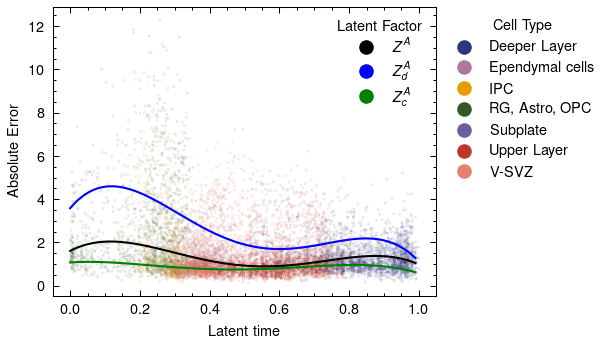

In [44]:
colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Deeper Layer', 'Ependymal cells', 'IPC', 'RG, Astro, OPC','Subplate', 
             'Upper Layer', 'V-SVZ']
colors = dict(zip(cell_type, colors))




X = latent_acc
Y = latent_expr

b = inv(X.T.dot(X)).dot(X.T).dot(Y)
Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_1 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_1, 4)
p = np.poly1d(z)



X = latent_atac_dep
Y = latent_expr_dep

b = inv(X.T.dot(X)).dot(X.T).dot(Y)

Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_2 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_2, 4)
p_1 = np.poly1d(z)



X = latent_atac_indep
Y = latent_expr_indep

b = inv(X.T.dot(X)).dot(X.T).dot(Y)

Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_3 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_3, 4)
p_2 = np.poly1d(z)



%matplotlib inline

fig, ax = plt.subplots()

plt.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
plt.scatter(df_meta['latent_time'], Y_Residual_2, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
plt.scatter(df_meta['latent_time'], Y_Residual_3, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)

Times = np.arange(0.0, 1.0, 0.01)
plt.plot(Times, p(Times),color='black')
plt.plot(Times, p_1(Times),color='green')
plt.plot(Times, p_2(Times),color='blue')




colors = ['black','blue','green']
cell_type = ['$Z^{A}$','$Z^{A}_d$','$Z^{A}_c$']
colors = dict(zip(cell_type, colors))

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
legend_1 = plt.legend(title='Latent Factor', handles=handles, bbox_to_anchor=(1., 1), loc='upper right')
ax.add_artist(legend_1)



colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Deeper Layer', 'Ependymal cells', 'IPC', 'RG, Astro, OPC','Subplate', 
             'Upper Layer', 'V-SVZ']
colors = dict(zip(cell_type, colors))

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
plt.legend(title='Cell Type', handles=handles, bbox_to_anchor=(1, 1), loc='best')


# plt.title('My title')
plt.xlabel('Latent time')
plt.ylabel('Absolute Error')

plt.show()


In [56]:
adata_RNA_sub  = adata_mvi[:, adata_mvi.var['feature_types'] == 'Gene Expression']
sc.pp.normalize_per_cell(adata_RNA_sub)
sc.pp.log1p(adata_RNA_sub)

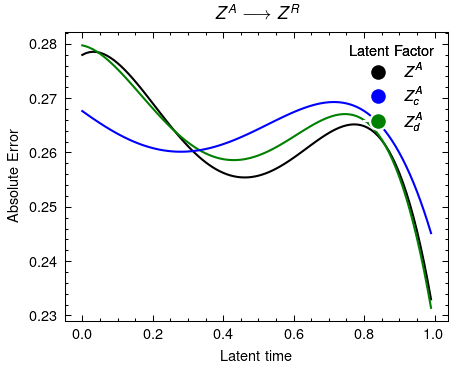

In [109]:
Y =  adata_RNA_sub.X.toarray()


X = latent_acc

b = inv(X.T.dot(X)).dot(X.T).dot(Y)
Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_1 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_1, 4)
p = np.poly1d(z)



X = latent_atac_dep

b = inv(X.T.dot(X)).dot(X.T).dot(Y)

Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_2 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_2, 4)
p_1 = np.poly1d(z)



X = latent_atac_indep

b = inv(X.T.dot(X)).dot(X.T).dot(Y)

Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_3 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_3, 4)
p_2 = np.poly1d(z)



%matplotlib inline

fig, ax = plt.subplots()

# plt.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
# plt.scatter(df_meta['latent_time'], Y_Residual_2, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
# plt.scatter(df_meta['latent_time'], Y_Residual_3, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)

Times = np.arange(0.0, 1.0, 0.01)
plt.plot(Times, p(Times),color='black')
plt.plot(Times, p_1(Times),color='green')
plt.plot(Times, p_2(Times),color='blue')




colors = ['black','blue','green']
cell_type = ['$Z^{A}$','$Z^{A}_{c}$','$Z^{A}_{d}$']
colors = dict(zip(cell_type, colors))

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
legend_1 = plt.legend(title='Latent Factor', handles=handles, bbox_to_anchor=(1., 1), loc='upper right')
ax.add_artist(legend_1)


plt.title('$Z^{A}$ $\longrightarrow$ $Z^{R}$')
plt.xlabel('Latent time')
plt.ylabel('Absolute Error')

plt.show()

In [51]:
# multivi 
multivi_z  = np.load('../E18_mouse_Brain/z.npy')
multivi_atac = np.load('../E18_mouse_Brain/z_atac.npy')
multivi_rna = np.load('../E18_mouse_Brain/z_rna.npy')

In [52]:
# scmvp
scmvp_atac = np.load('../E18_mouse_Brain/SCMVP_atac.npy')
scmvp_rna = np.load('../E18_mouse_Brain/z_rna.npy')

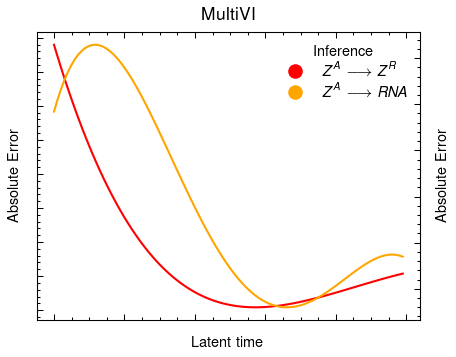

In [105]:
colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Deeper Layer', 'Ependymal cells', 'IPC', 'RG, Astro, OPC','Subplate', 
             'Upper Layer', 'V-SVZ']
colors = dict(zip(cell_type, colors))


X = multivi_atac
Y =  multivi_rna

b = inv(X.T.dot(X)).dot(X.T).dot(Y)
Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_1 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_1, 4)
p_1 = np.poly1d(z)


Y =  adata_RNA_sub.X.toarray()


b = inv(X.T.dot(X)).dot(X.T).dot(Y)

Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_2 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_2, 4)
p_2 = np.poly1d(z)



%matplotlib inline

fig, ax1 = plt.subplots()

# plt.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
# plt.scatter(df_meta['latent_time'], Y_Residual_2, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
# plt.scatter(df_meta['latent_time'], Y_Residual_3, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)

Times = np.arange(0.0, 1.0, 0.01)

ax1.plot(Times, p_1(Times),color='red')
ax2 = ax1.twinx()
ax2.plot(Times, p_2(Times),color='orange')



colors = ['red','orange']
cell_type = ['$Z^{A} \longrightarrow Z^{R}$','$Z^{A} \longrightarrow RNA$']
colors = dict(zip(cell_type, colors))

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
legend_1 = plt.legend(title='Inference', handles=handles, bbox_to_anchor=(1., 1), loc='upper right')
# ax1.add_artist(legend_1)



colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Deeper Layer', 'Ependymal cells', 'IPC', 'RG, Astro, OPC','Subplate', 
             'Upper Layer', 'V-SVZ']
colors = dict(zip(cell_type, colors))

# handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
# plt.legend(title='Cell Type', handles=handles, bbox_to_anchor=(1, 1), loc='best')


plt.title('MultiVI')
ax1.set_xlabel('Latent time')
ax1.set_ylabel('Absolute Error')
ax2.set_ylabel('Absolute Error')




ax1.set_yticklabels([])
ax1.set_xticklabels([])
ax2.set_yticklabels([])
ax2.set_xticklabels([])
# ax.set_frame_on(False)
# ax.xaxis.get_ticklabels('none')
plt.show()

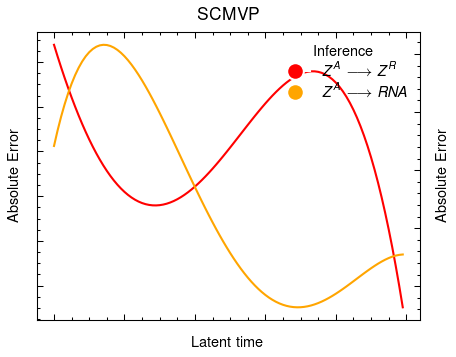

In [106]:
X = scmvp_atac
Y =  scmvp_rna

b = inv(X.T.dot(X)).dot(X.T).dot(Y)
Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_1 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_1, 4)
p_1 = np.poly1d(z)


Y =  adata_RNA_sub.X.toarray()


b = inv(X.T.dot(X)).dot(X.T).dot(Y)

Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_2 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_2, 4)
p_2 = np.poly1d(z)


%matplotlib inline

fig, ax1 = plt.subplots()

Times = np.arange(0.0, 1.0, 0.01)

ax1.plot(Times, p_1(Times),color='red')
# ax1.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
ax2 = ax1.twinx()
ax2.plot(Times, p_2(Times),color='orange')
# ax2.scatter(df_meta['latent_time'], Y_Residual_2, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)


colors = ['red','orange']
cell_type = ['$Z^{A} \longrightarrow Z^{R}$','$Z^{A} \longrightarrow RNA$']
colors = dict(zip(cell_type, colors))

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
legend_1 = plt.legend(title='Inference', handles=handles, bbox_to_anchor=(1., 1), loc='upper right')
# ax1.add_artist(legend_1)


plt.title('SCMVP')
ax1.set_xlabel('Latent time')
ax1.set_ylabel('Absolute Error')
ax2.set_ylabel('Absolute Error')




ax1.set_yticklabels([])
ax1.set_xticklabels([])
ax2.set_yticklabels([])
ax2.set_xticklabels([])
# ax.set_frame_on(False)
# ax.xaxis.get_ticklabels('none')
plt.show()

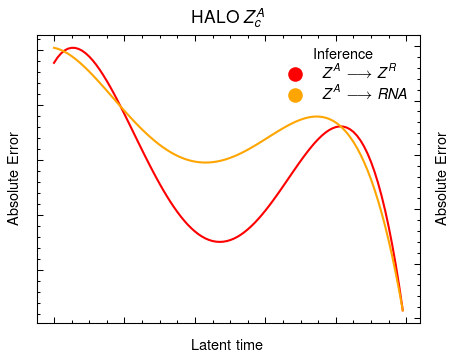

In [107]:
X = latent_atac_dep
Y =  latent_expr_dep

b = inv(X.T.dot(X)).dot(X.T).dot(Y)
Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_1 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_1, 4)
p_1 = np.poly1d(z)


Y =  adata_RNA_sub.X.toarray()


b = inv(X.T.dot(X)).dot(X.T).dot(Y)

Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_2 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_2, 4)
p_2 = np.poly1d(z)



%matplotlib inline

fig, ax1 = plt.subplots()

# plt.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
# plt.scatter(df_meta['latent_time'], Y_Residual_2, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
# plt.scatter(df_meta['latent_time'], Y_Residual_3, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)

Times = np.arange(0.0, 1.0, 0.01)

ax1.plot(Times, p_1(Times),color='red')
# ax1.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
ax2 = ax1.twinx()
ax2.plot(Times, p_2(Times),color='orange')
# ax2.scatter(df_meta['latent_time'], Y_Residual_2, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)



colors = ['red','orange']
cell_type = ['$Z^{A} \longrightarrow Z^{R}$','$Z^{A} \longrightarrow RNA$']
colors = dict(zip(cell_type, colors))

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
legend_1 = plt.legend(title='Inference', handles=handles, bbox_to_anchor=(1., 1), loc='upper right')
# ax1.add_artist(legend_1)


plt.title('HALO $Z^{A}_{c}$')
ax1.set_xlabel('Latent time')
ax1.set_ylabel('Absolute Error')
ax2.set_ylabel('Absolute Error')




ax1.set_yticklabels([])
ax1.set_xticklabels([])
ax2.set_yticklabels([])
ax2.set_xticklabels([])
# ax.set_frame_on(False)
# ax.xaxis.get_ticklabels('none')
plt.show()

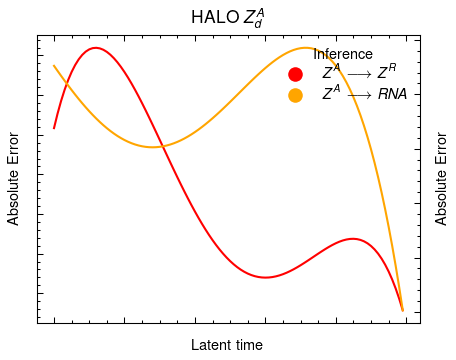

In [108]:
X = latent_atac_indep
Y =  latent_expr_indep

b = inv(X.T.dot(X)).dot(X.T).dot(Y)
Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_1 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_1, 4)
p_1 = np.poly1d(z)


Y =  adata_RNA_sub.X.toarray()


b = inv(X.T.dot(X)).dot(X.T).dot(Y)

Yhat = X.dot(b)
Y_Residual = Yhat - Y
Y_Residual_2 = np.mean(np.abs(Y_Residual),axis=1)

z = np.polyfit(df_meta['latent_time'], Y_Residual_2, 4)
p_2 = np.poly1d(z)



%matplotlib inline

fig, ax1 = plt.subplots()

# plt.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
# plt.scatter(df_meta['latent_time'], Y_Residual_2, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
# plt.scatter(df_meta['latent_time'], Y_Residual_3, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)

Times = np.arange(0.0, 1.0, 0.01)

ax1.plot(Times, p_1(Times),color='red')
# ax1.scatter(df_meta['latent_time'], Y_Residual_1, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)
ax2 = ax1.twinx()
ax2.plot(Times, p_2(Times),color='orange')
# ax2.scatter(df_meta['latent_time'], Y_Residual_2, color=df_meta['celltype'].map(colors),s=0.03,alpha = 0.3)



colors = ['red','orange']
cell_type = ['$Z^{A} \longrightarrow Z^{R}$','$Z^{A} \longrightarrow RNA$']
colors = dict(zip(cell_type, colors))

handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
legend_1 = plt.legend(title='Inference', handles=handles, bbox_to_anchor=(1., 1), loc='upper right')
# ax1.add_artist(legend_1)


# handles = [Line2D([0], [0], marker='o', color='w', markerfacecolor=v, label=k, markersize=8) for k, v in colors.items()]
# plt.legend(title='Cell Type', handles=handles, bbox_to_anchor=(1, 1), loc='best')


plt.title('HALO $Z^{A}_{d}$')
ax1.set_xlabel('Latent time')
ax1.set_ylabel('Absolute Error')
ax2.set_ylabel('Absolute Error')




ax1.set_yticklabels([])
ax1.set_xticklabels([])
ax2.set_yticklabels([])
ax2.set_xticklabels([])
# ax.set_frame_on(False)
# ax.xaxis.get_ticklabels('none')
plt.show()

# UMAP plot

In [5]:
colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Upper Layer',
                'Deeper Layer',
                'V-SVZ',
                'RG, Astro, OPC',
                'Ependymal cells',
                'IPC',
                'Subplate']
adata_mvi.obs['celltype'] = adata_mvi.obs['celltype'].cat.reorder_categories(cell_type)

In [6]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()
import matplotlib.pyplot as plt

In [7]:
adata_mvi.obsm["latent"] = np.concatenate((latent_acc,latent_expr),axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.leiden(adata_mvi,resolution = 0.3)

In [8]:
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=15)
sc.tl.leiden(adata_mvi,resolution = 0.3)

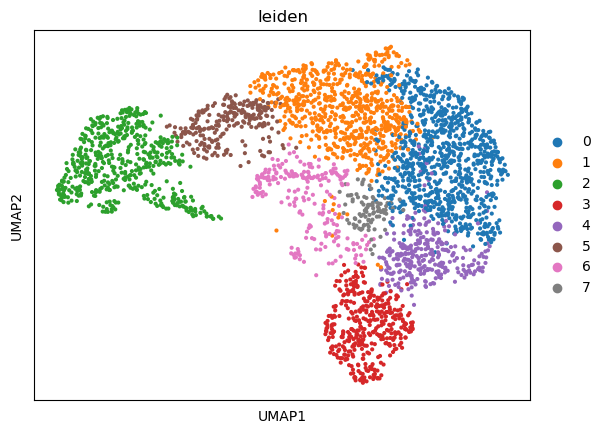

In [9]:
sc.pl.umap(adata_mvi, color=['leiden'])

In [10]:
adata_RNA  = adata_mvi[:, adata_mvi.var['feature_types'] == 'Gene Expression']
adata_ATAC  = adata_mvi[:, adata_mvi.var['feature_types'] == 'Peaks']

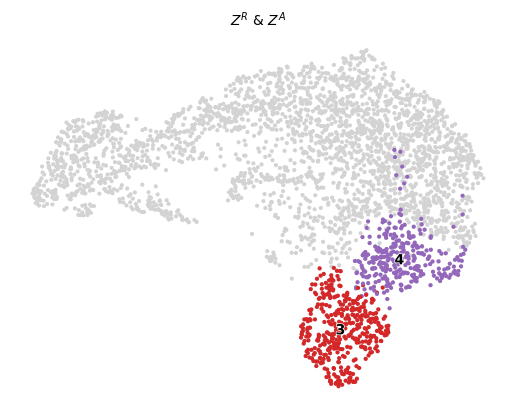

In [154]:
# scv.pl.scatter(adata_RNA, groups=[[c] for c in adata_RNA.obs['leiden'].cat.categories], color='leiden', ncols=2)
scv.pl.scatter(adata_RNA, groups=['3','4'], color='leiden', ncols=2,title = '$Z^{R}$ & $Z^{A}$')

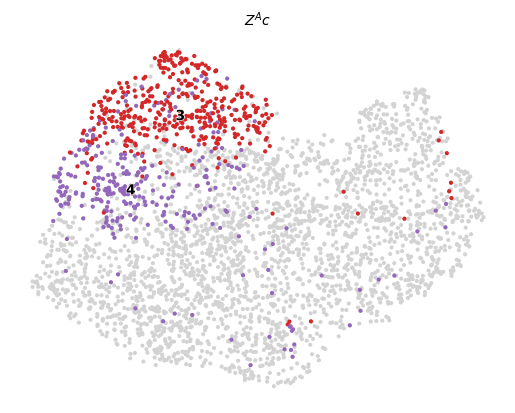

In [165]:
adata_RNA.obsm["latent"] = latent_atac_dep
sc.pp.neighbors(adata_RNA, use_rep="latent", n_neighbors=25)
sc.tl.umap(adata_RNA,min_dist =0.5)
scv.pl.scatter(adata_RNA, groups=['3','4'], color='leiden', ncols=2,title = '$Z^{A}_{c}$')

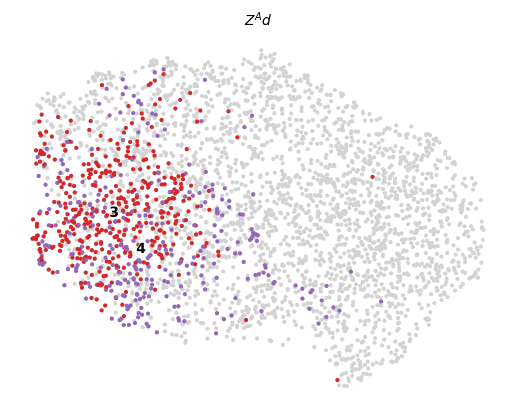

In [166]:
adata_RNA.obsm["latent"] = latent_atac_indep
sc.pp.neighbors(adata_RNA, use_rep="latent", n_neighbors=25)
sc.tl.umap(adata_RNA,min_dist =0.5)
scv.pl.scatter(adata_RNA, groups=['3','4'], color='leiden', ncols=2,title = '$Z^{A}_{d}$')

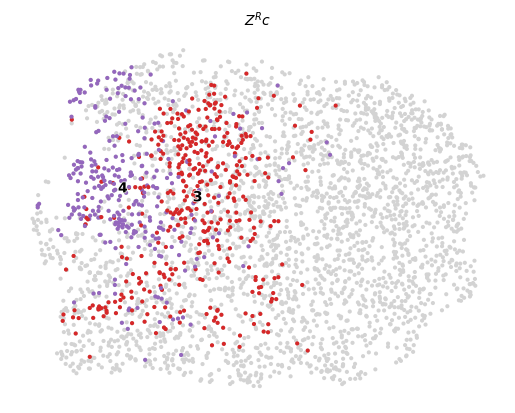

In [163]:
adata_RNA.obsm["latent"] = latent_expr_dep
sc.pp.neighbors(adata_RNA, use_rep="latent", n_neighbors=25)
sc.tl.umap(adata_RNA,min_dist =0.5)
scv.pl.scatter(adata_RNA, groups=['3,4'], color='leiden', ncols=2,title = '$Z^{R}_{c}$')

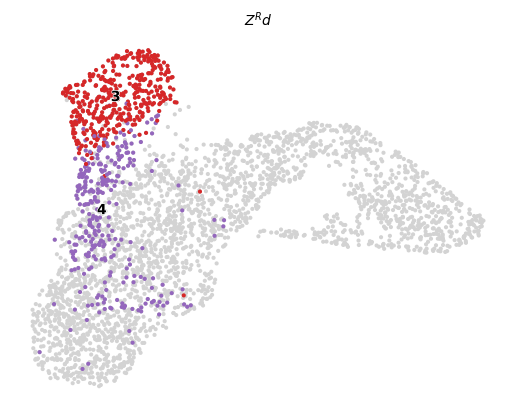

In [158]:
adata_RNA.obsm["latent"] = latent_expr_indep
sc.pp.neighbors(adata_RNA, use_rep="latent", n_neighbors=25)
sc.tl.umap(adata_RNA,min_dist =0.5)
scv.pl.scatter(adata_RNA, groups=['3','4'], color='leiden', ncols=2,title = '$Z^{R}_{d}$')

In [11]:
sc.pp.normalize_per_cell(adata_RNA)
sc.pp.log1p(adata_RNA)

In [236]:
# sc.tl.rank_genes_groups(adata_RNA, 'leiden', method='wilcoxon')

In [13]:
sc.tl.rank_genes_groups(adata_RNA, 'leiden', groups=['4'], method='wilcoxon')

In [226]:
adata_RNA.uns['rank_genes_groups']['names'][1:100]

rec.array([('Ptprd',), ('Kcnq5',), ('Nrg3',), ('Lrfn5',), ('Ssbp2',),
           ('Sox5',), ('Nin',), ('Kirrel3',), ('Tox',), ('Dync1i1',),
           ('Tshz3',), ('Schip1',), ('Galntl6',), ('Ncam2',), ('Spock1',),
           ('Scn2a',), ('Ctnnd2',), ('Sybu',), ('Mdga2',), ('Nrcam',),
           ('Cadm1',), ('Sgcz',), ('Chsy3',), ('Carmil1',), ('Robo1',),
           ('Khdrbs2',), ('Grm5',), ('Meg3',), ('Nlgn1',), ('Gm26871',),
           ('Tenm2',), ('Pde4b',), ('Nav3',), ('Magi3',), ('Grin2b',),
           ('B3gat1',), ('Tmtc1',), ('Cnksr2',), ('Cntn5',), ('Csmd3',),
           ('Csrnp3',), ('Nrg3os',), ('Pfkp',), ('Ralyl',), ('Cntnap2',),
           ('Tmem108',), ('Cntn1',), ('Dlg2',), ('Gabrb2',), ('Trpm3',),
           ('Kif26a',), ('Mef2c',), ('Arpp21',), ('Ncam1',), ('Slc6a15',),
           ('Zfp804a',), ('Sparcl1',), ('Gm20642',), ('Celf2',),
           ('Ephb1',), ('B3galt2',), ('Tusc3',), ('Dpp6',), ('Syt1',),
           ('St3gal1',), ('Ptprr',), ('Foxp1',), ('Lrrc4c',), ('Net

In [18]:
from statannot import add_stat_annotation

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Robo1_3 v.s. Robo1_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.487e-70 U_stat=1.290e+04
Tle4_3 v.s. Tle4_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.409e-71 U_stat=1.071e+05
Ldb2_3 v.s. Ldb2_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.917e-50 U_stat=2.043e+04
Kirrel3_3 v.s. Kirrel3_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.276e-12 U_stat=4.103e+04
Tox_3 v.s. Tox_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.066e-22 U_stat=3.426e+04


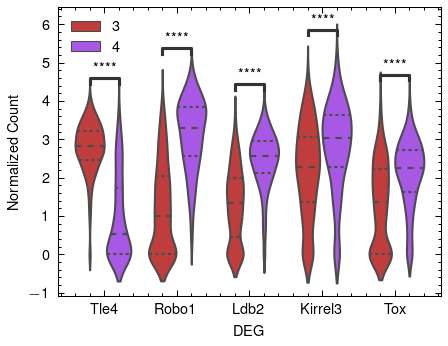

In [31]:
adata_RNA_sub = adata_RNA[adata_RNA.obs.leiden.isin(['3','4'])].copy()
df = sc.get.obs_df(adata_RNA_sub, ['Tle4', 'Robo1', 'Ldb2', 'Kirrel3','Tox','leiden'])
df = df.set_index('leiden').stack().reset_index()
df.columns = ['leiden', 'gene', 'Normalized Expression']
import seaborn as sns

my_pal = {"3": "#d62728", "4": "#aa40fc"}


ax = sns.violinplot(data=df, x='gene', y='Normalized Expression', hue="leiden",
                split=False, inner="quart", linewidth=1, palette=my_pal)      

ax.set(
    xlabel='DEG', 
    ylabel='Normalized Count'
)

add_stat_annotation(ax, data=df, x='gene', y='Normalized Expression', hue="leiden",
                    box_pairs=[(("Tle4", "3"), ("Tle4", "4")),
                                 (("Robo1", "3"), ("Robo1", "4")),
                                 (("Ldb2", "3"), ("Ldb2", "4")),
                               (("Kirrel3", "3"), ("Kirrel3", "4")),
                               (("Tox", "3"), ("Tox", "4"))
                                ],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=2)


plt.legend(loc='upper left')

plt.show()

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Robo1_3 v.s. Robo1_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.487e-70 U_stat=1.290e+04
Tle4_3 v.s. Tle4_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.409e-71 U_stat=1.071e+05
Ldb2_3 v.s. Ldb2_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.917e-50 U_stat=2.043e+04
Kirrel3_3 v.s. Kirrel3_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.276e-12 U_stat=4.103e+04
Tox_3 v.s. Tox_4: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.066e-22 U_stat=3.426e+04


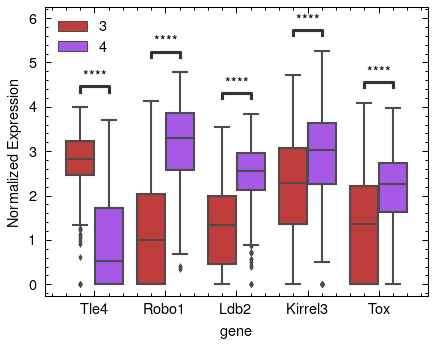

In [30]:
ax = sns.boxplot(data=df, x='gene', y='Normalized Expression', hue="leiden",
                 palette=my_pal,fliersize=1)      

add_stat_annotation(ax, data=df, x='gene', y='Normalized Expression', hue="leiden",
                    box_pairs=[(("Tle4", "3"), ("Tle4", "4")),
                                 (("Robo1", "3"), ("Robo1", "4")),
                                 (("Ldb2", "3"), ("Ldb2", "4")),
                               (("Kirrel3", "3"), ("Kirrel3", "4")),
                               (("Tox", "3"), ("Tox", "4"))
                                ],
                    test='Mann-Whitney', text_format='star', loc='inside', verbose=2)

plt.legend(loc='upper left')
plt.show()

In [233]:
from typing import Mapping, Sequence
from matplotlib import cm, colors

# Colorblindness adjusted vega_10
# See https://github.com/scverse/scanpy/issues/387
vega_10 = list(map(colors.to_hex, cm.tab10.colors))
vega_10_scanpy = vega_10.copy()
vega_10_scanpy[2] = '#279e68'  # green
vega_10_scanpy[4] = '#aa40fc'  # purple
vega_10_scanpy[8] = '#b5bd61'  # kakhi

In [234]:
vega_10_scanpy

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#b5bd61',
 '#17becf']

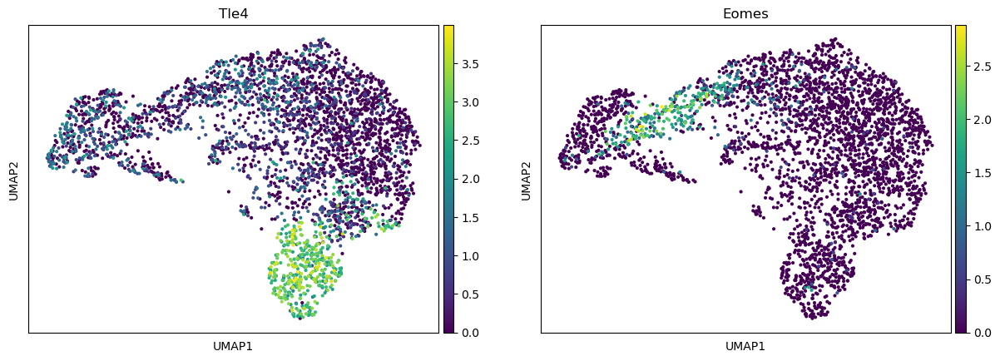

In [78]:
sc.pl.umap(adata_RNA, color=['Tle4', 'Eomes']) # IPCs and deep layer neurons

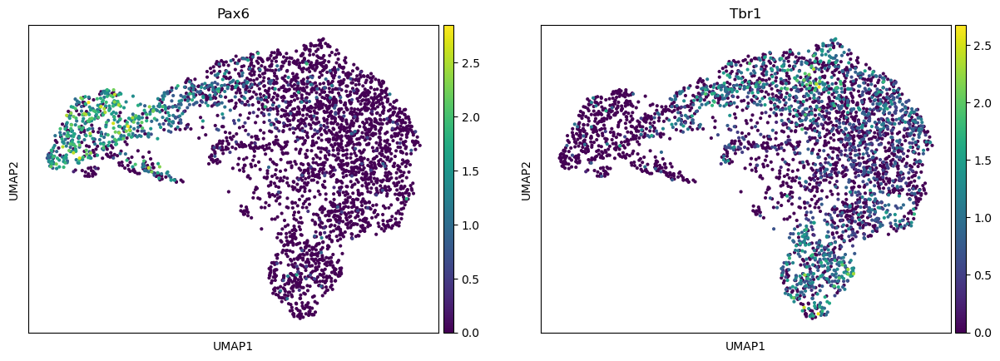

In [81]:
sc.pl.umap(adata_RNA, color=['Pax6','Tbr1']) # IPCs and radial glia, postmitotic neuron 

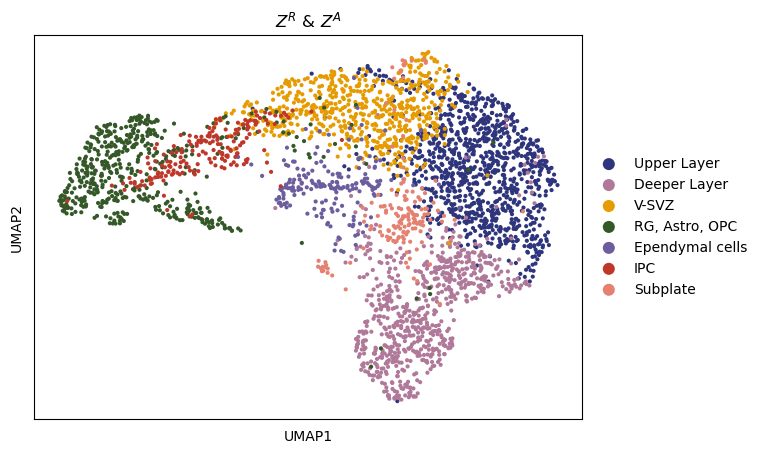

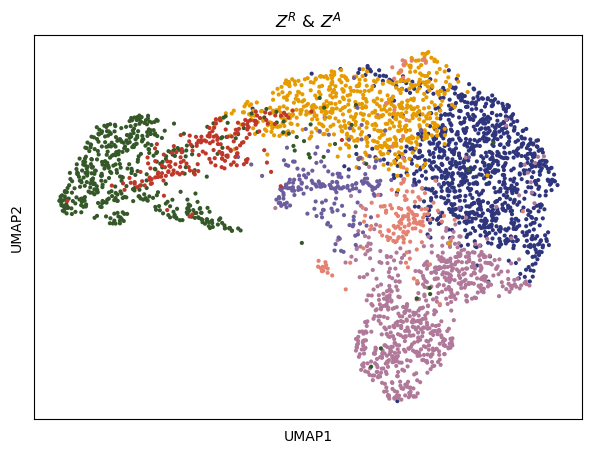

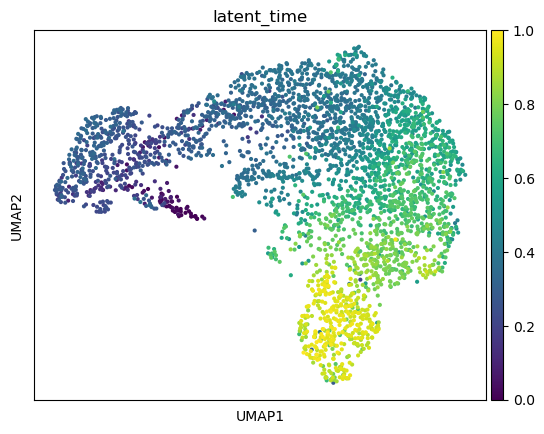

In [7]:
adata_mvi.obsm["latent"] = np.concatenate((latent_acc,latent_expr),axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{R}$ & $Z^{A}$',palette=colors)
plt.show()
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{R}$ & $Z^{A}$',palette=colors,legend_loc='none')
plt.show()
sc.pl.umap(adata_mvi, color=['latent_time'])
plt.show()

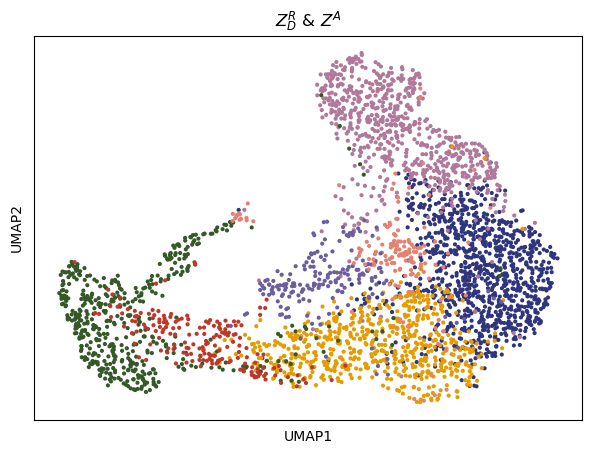

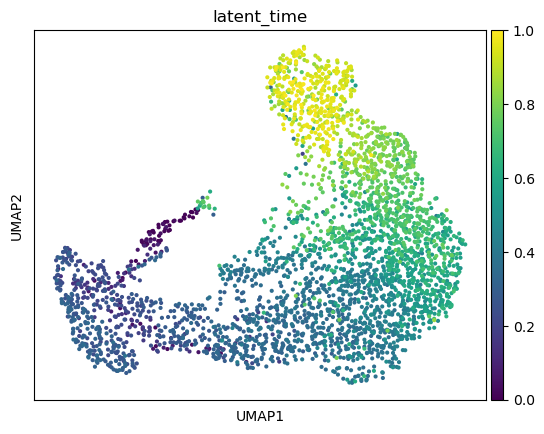

In [23]:
adata_mvi.obsm["latent"] = np.concatenate((latent_acc,latent_expr_indep),axis=1)
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{R}_{D}$ & $Z^{A}$',palette=colors,legend_loc='none')
plt.show()

sc.pl.umap(adata_mvi, color=['latent_time'])
plt.show()

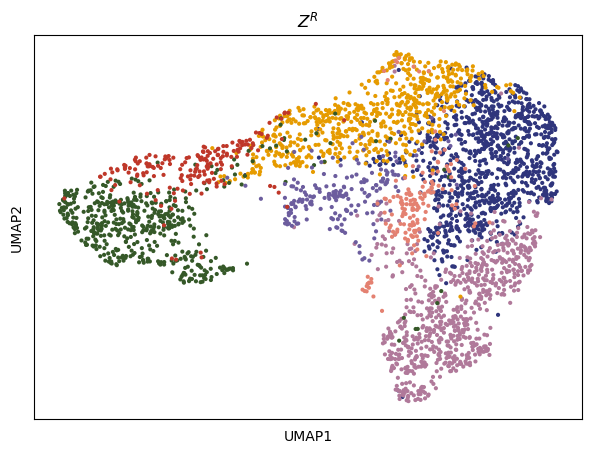

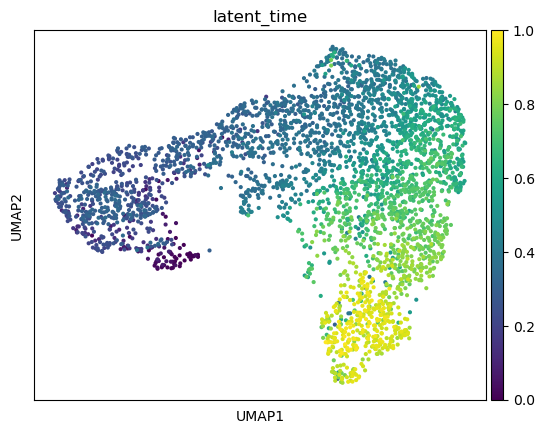

In [52]:
adata_mvi.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{R}$',palette=colors,legend_loc='none')
plt.show()

sc.pl.umap(adata_mvi, color=['latent_time'])
plt.show()

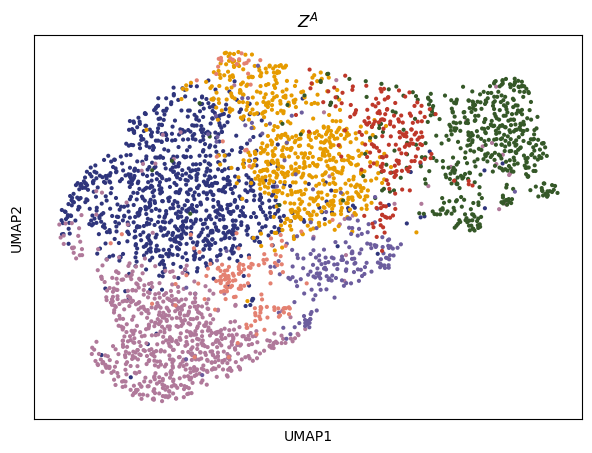

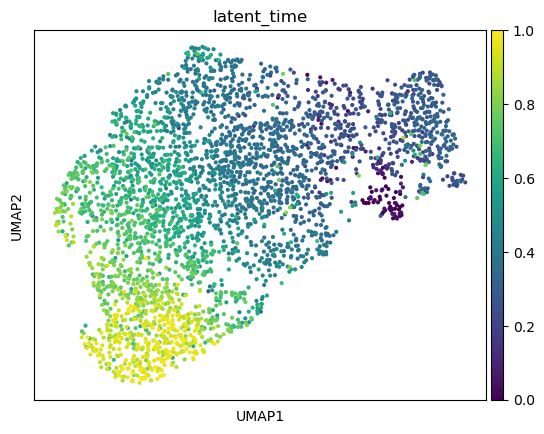

In [53]:
adata_mvi.obsm["latent"] = latent_acc
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{A}$',palette=colors,legend_loc='none')
plt.show()

sc.pl.umap(adata_mvi, color=['latent_time'])
plt.show()

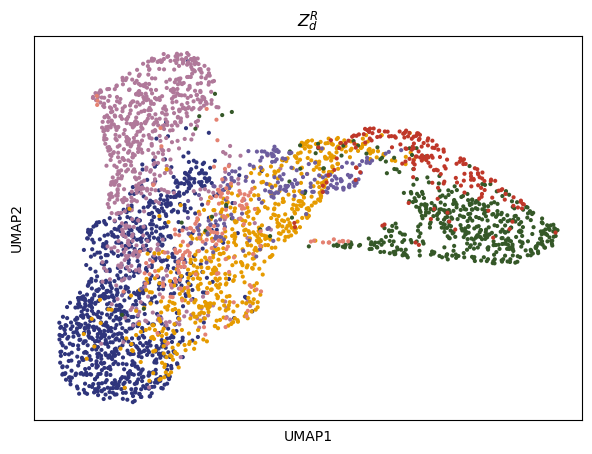

In [24]:
adata_mvi.obsm["latent"] = latent_expr_indep
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{R}_{d}$',palette=colors,legend_loc='none')
plt.show()

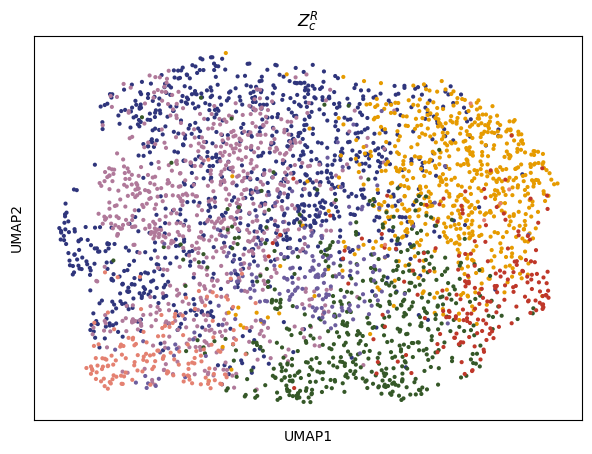

In [ ]:
adata_mvi.obsm["latent"] = latent_expr_dep
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{R}_{c}$',palette=colors,legend_loc='none')
plt.show()

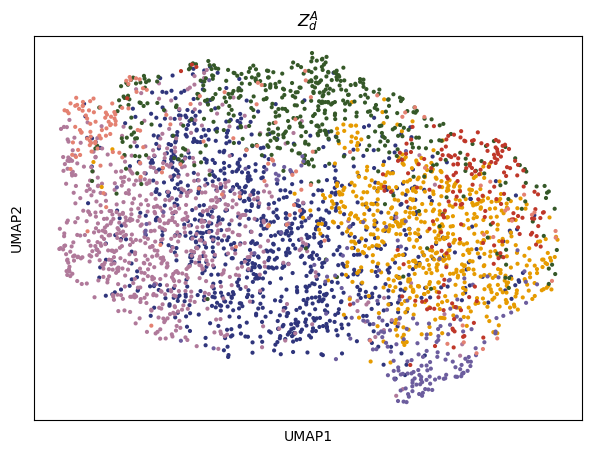

In [ ]:
adata_mvi.obsm["latent"] = latent_atac_indep
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{A}_{d}$',palette=colors,legend_loc='none')
plt.show()

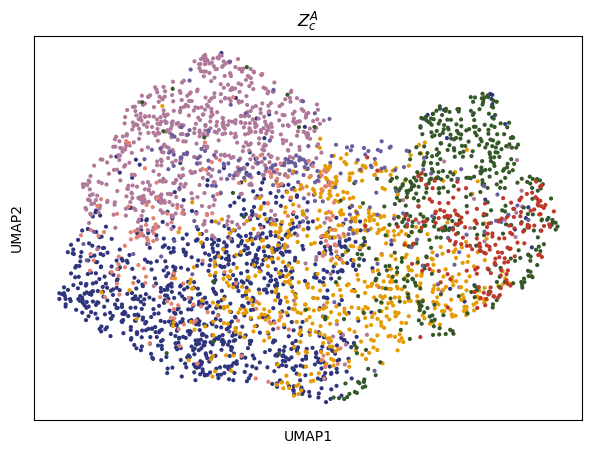

In [29]:
adata_mvi.obsm["latent"] = latent_atac_dep
sc.pp.neighbors(adata_mvi, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_mvi,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_mvi,color='celltype',basis='umap',
             title = '$Z^{A}_{c}$',palette=colors,legend_loc='none')
plt.show()

# Velocity

In [5]:
import tkinter
import matplotlib
import matplotlib.pyplot as plt
# plt.style.use(['science','nature'])
from matplotlib.lines import Line2D  # for legend handle

# import met_brewer
plt.rcParams['figure.dpi'] = 150

from numpy.linalg import inv
import pandas as pd

# import pwlf
# def piecewise_linear(x, x0, y0, k1, k2):
#     return np.piecewise(x, [x < x0], [lambda x:k1*x + y0-k1*x0, lambda x:k2*x + y0-k2*x0])

In [6]:
colors = ['#2f357c', '#b0799a', '#e69b00', '#355828', '#6c5d9e', '#bf3729', '#e48171']
cell_type = ['Upper Layer',
                'Deeper Layer',
                'V-SVZ',
                'RG, Astro, OPC',
                'Ependymal cells',
                'IPC',
                'Subplate']
adata_mvi.obs['celltype'] = adata_mvi.obs['celltype'].cat.reorder_categories(cell_type)

In [7]:
latent_expr, latent_acc,latent_expr_dep, latent_atac_dep, latent_expr_indep, latent_atac_indep, times  = model.get_latent_representation()

In [7]:
import multivelo as mv

In [8]:
adata_result = sc.read_h5ad("../E18_mouse_Brain/multivelo_result.h5ad")

In [9]:
adata_result

AnnData object with n_obs × n_vars = 3365 × 865
    obs: 'n_counts', 'celltype'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'fit_alpha_c', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_sw1', 'fit_t_sw2', 'fit_t_sw3', 'fit_scale_cc', 'fit_rescale_c', 'fit_rescale_u', 'fit_alignment_scaling', 'fit_model', 'fit_direction', 'fit_loss', 'fit_likelihood', 'fit_likelihood_c', 'fit_ssd_c', 'fit_var_c', 'fit_c0', 'fit_u0', 'fit_s0', 'fit_anchor_min_idx', 'fit_anchor_max_idx', 'fit_anchor_velo_min_idx', 'fit_anchor_velo_max_idx', 'velo_s_genes', 'velo_u_genes', 'velo_chrom_genes'
    uns: 'celltype_colors', 'neighbors', 'pca', 'umap', 'velo_chrom_params', 'velo_s_params', 'velo_u_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs', 'fit_anchor_c', 'fit_anchor_c_sw', 'fit_anchor_c_velo', 'fit_anchor_s', 'fit_anchor_s_sw', 'fit_anchor_s_velo', 'fit_anchor_u', 'fit_anchor_u_sw', 'fit_anchor_u_velo'
    layers: 'ATAC', 'Ms', 'Mu', 'ambiguous', 'fit_state', 'fit_t', 'matrix', 'splice

In [25]:
mv.velocity_graph(adata_result)
mv.latent_time(adata_result)

computing velocity graph (using 1/6 cores)


  0%|          | 0/3365 [00:00<?, ?cells/s]

    finished (0:00:05) --> added 
    'velo_s_norm_graph', sparse matrix with cosine correlations (adata.uns)
computing terminal states
    identified 1 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


In [26]:
adata_result

AnnData object with n_obs × n_vars = 3365 × 865
    obs: 'n_counts', 'celltype', 'velo_s_norm_self_transition', 'root_cells', 'end_points', 'velo_s_norm_pseudotime', 'latent_time'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'fit_alpha_c', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_sw1', 'fit_t_sw2', 'fit_t_sw3', 'fit_scale_cc', 'fit_rescale_c', 'fit_rescale_u', 'fit_alignment_scaling', 'fit_model', 'fit_direction', 'fit_loss', 'fit_likelihood', 'fit_likelihood_c', 'fit_ssd_c', 'fit_var_c', 'fit_c0', 'fit_u0', 'fit_s0', 'fit_anchor_min_idx', 'fit_anchor_max_idx', 'fit_anchor_velo_min_idx', 'fit_anchor_velo_max_idx', 'velo_s_genes', 'velo_u_genes', 'velo_chrom_genes', 'velo_s_norm_genes'
    uns: 'celltype_colors', 'neighbors', 'pca', 'umap', 'velo_chrom_params', 'velo_s_params', 'velo_u_params', 'velo_s_norm_params', 'velo_s_norm_graph', 'velo_s_norm_graph_neg'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs', 'fit_anchor_c', 'fit_anchor_c_sw', 'fit_anchor_c_velo', 'fit_a

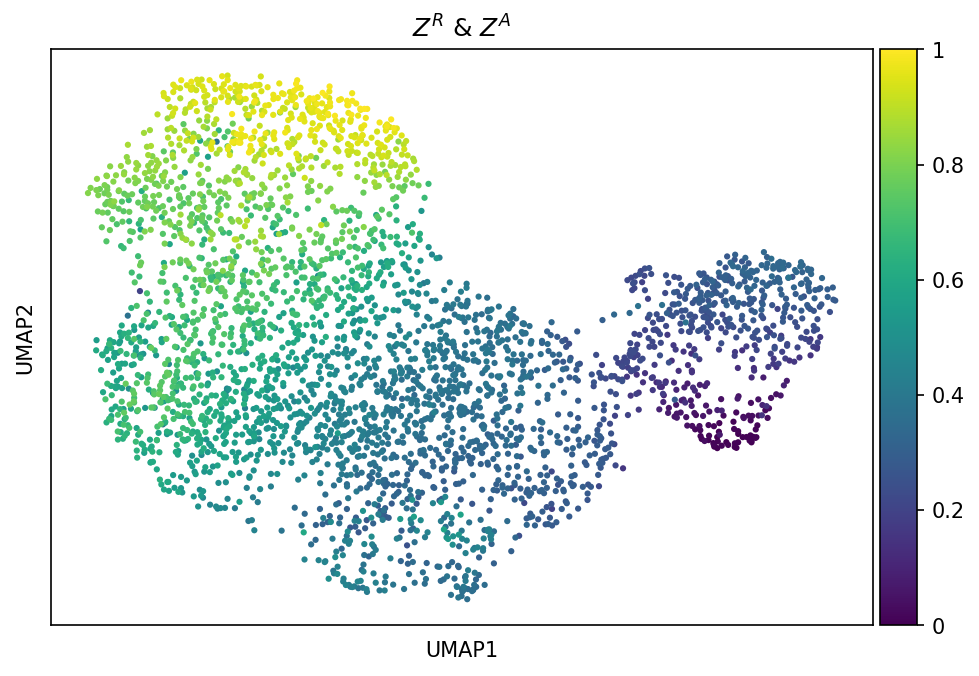

In [27]:
sc.pl.scatter(adata_result,color='latent_time',basis='umap',
             title = '$Z^{R}$ & $Z^{A}$',palette=colors)
plt.show()

computing velocity embedding
    finished (0:00:00) --> added
    'velo_s_norm_umap', embedded velocity vectors (adata.obsm)


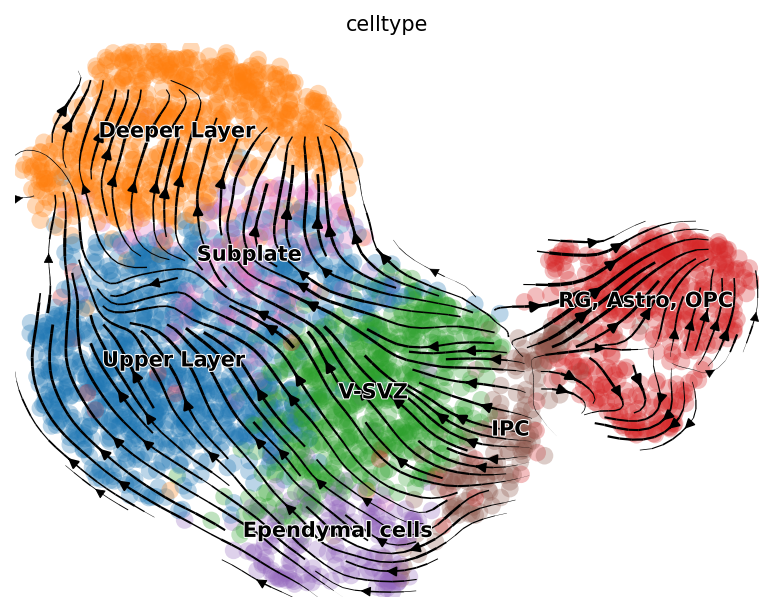

In [28]:
mv.velocity_embedding_stream(adata_result, basis='umap', color='celltype')

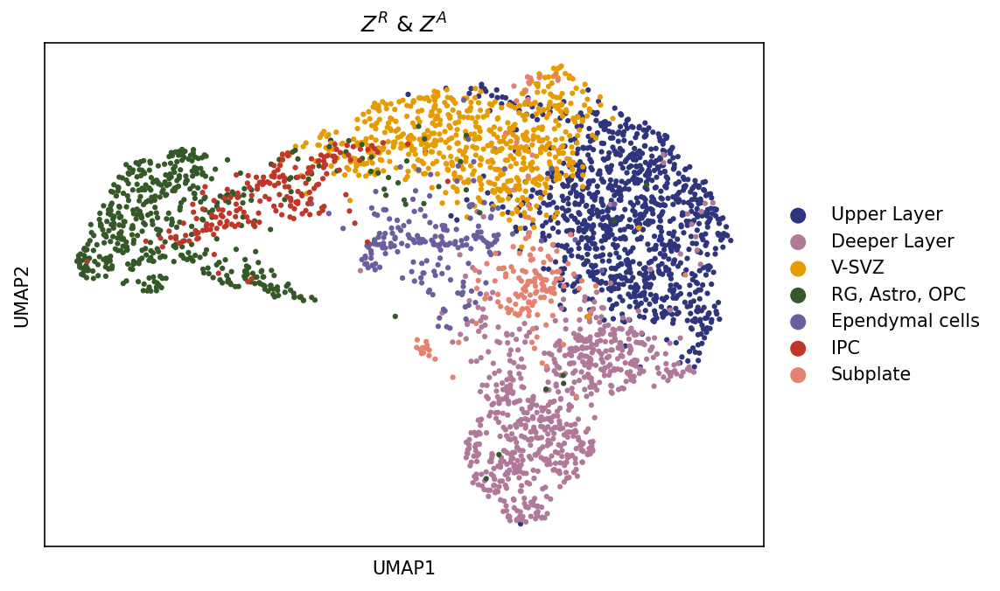

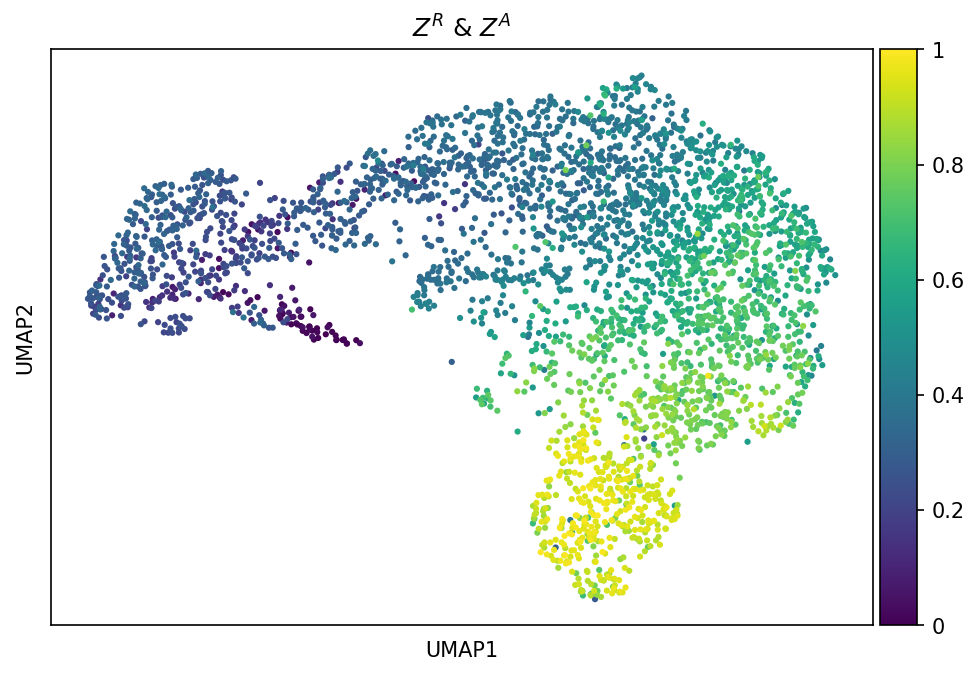

In [29]:
adata_result.obsm["latent"] = np.concatenate((latent_acc,latent_expr),axis=1)
sc.pp.neighbors(adata_result, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_result,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_result,color='celltype',basis='umap',
             title = '$Z^{R}$ & $Z^{A}$',palette=colors)
plt.show()

sc.pl.scatter(adata_result,color='latent_time',basis='umap',
             title = '$Z^{R}$ & $Z^{A}$',palette=colors)
plt.show()

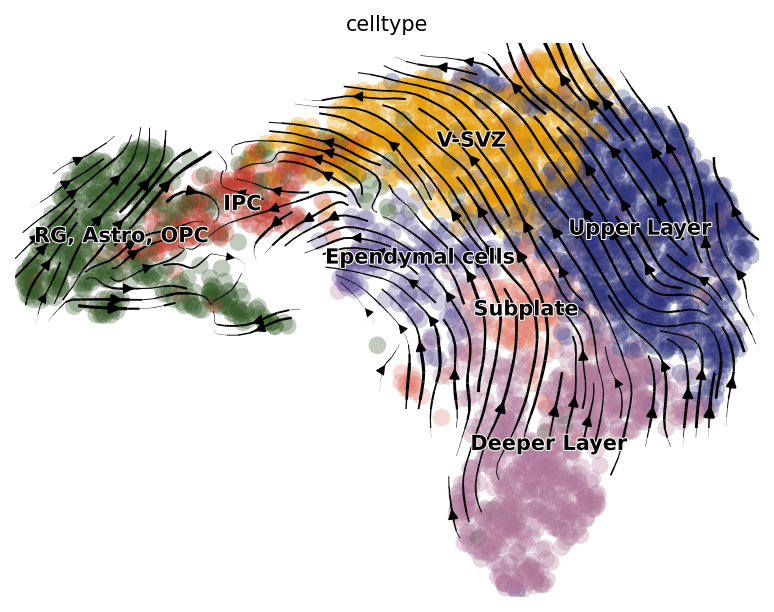

In [30]:
mv.velocity_embedding_stream(adata_result, basis='umap', color='celltype')

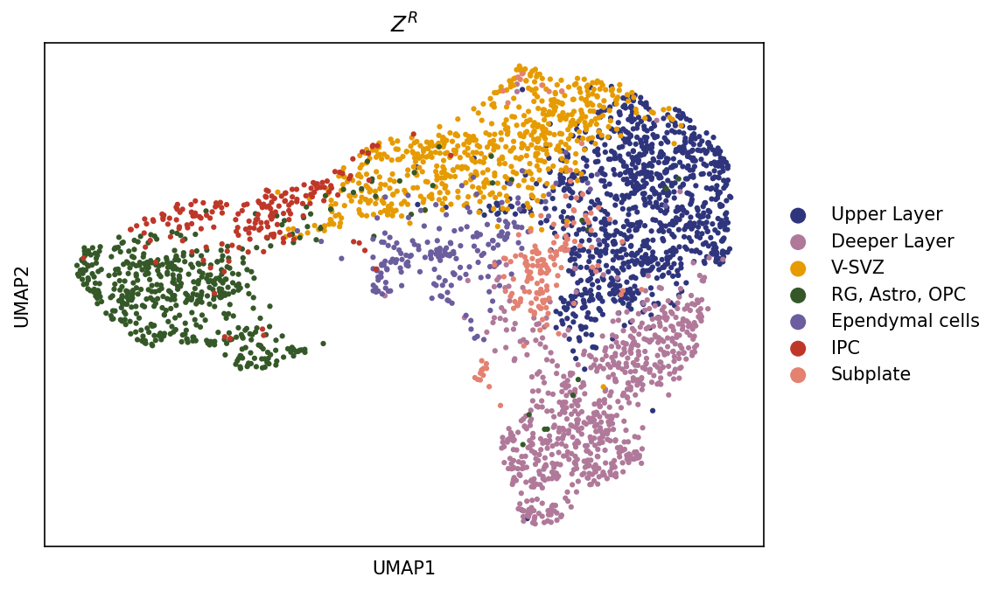

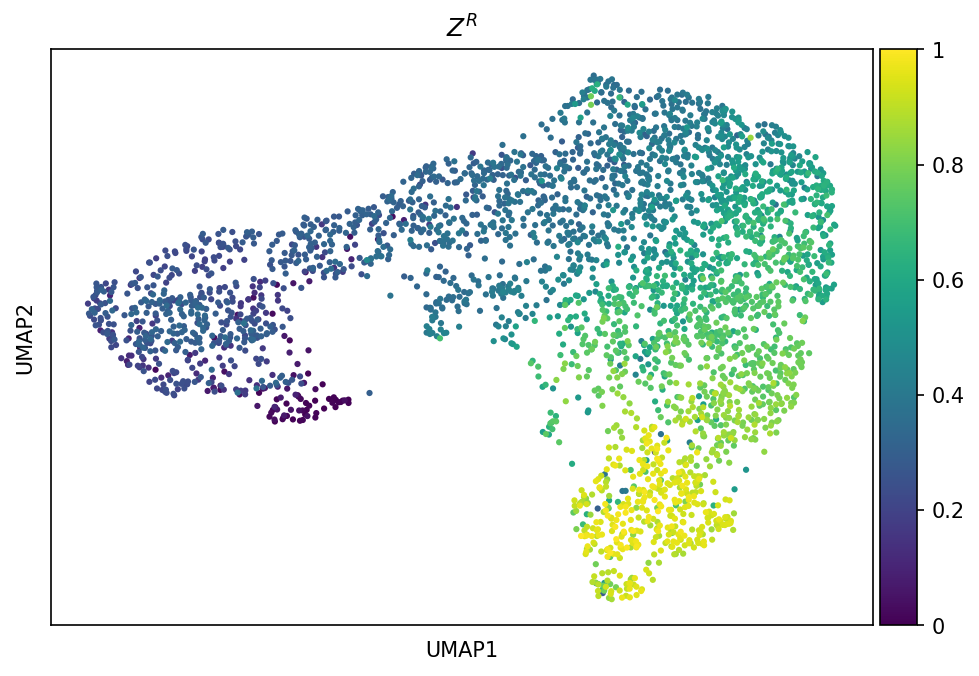

In [31]:
adata_result.obsm["latent"] = latent_expr
sc.pp.neighbors(adata_result, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_result,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_result,color='celltype',basis='umap',
             title = '$Z^{R}$',palette=colors)
plt.show()

sc.pl.scatter(adata_result,color='latent_time',basis='umap',
             title = '$Z^{R}$',palette=colors)
plt.show()

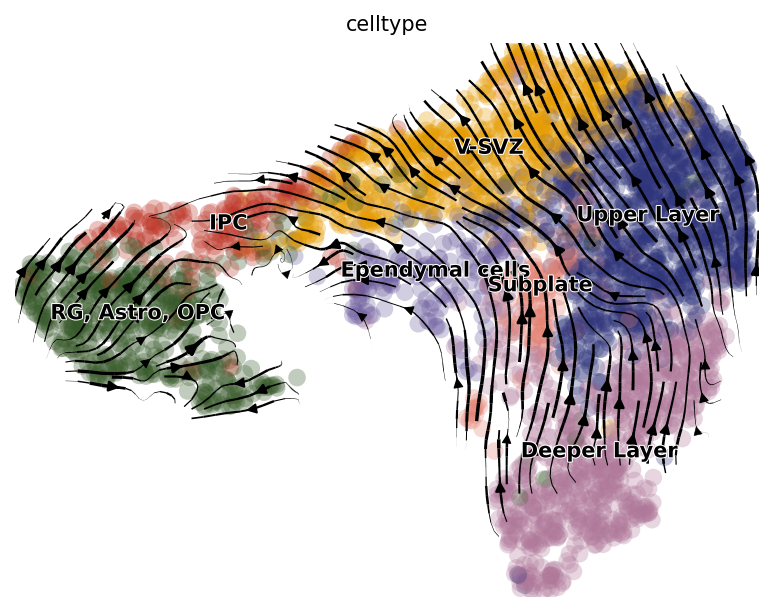

In [32]:
mv.velocity_embedding_stream(adata_result, basis='umap', color='celltype')

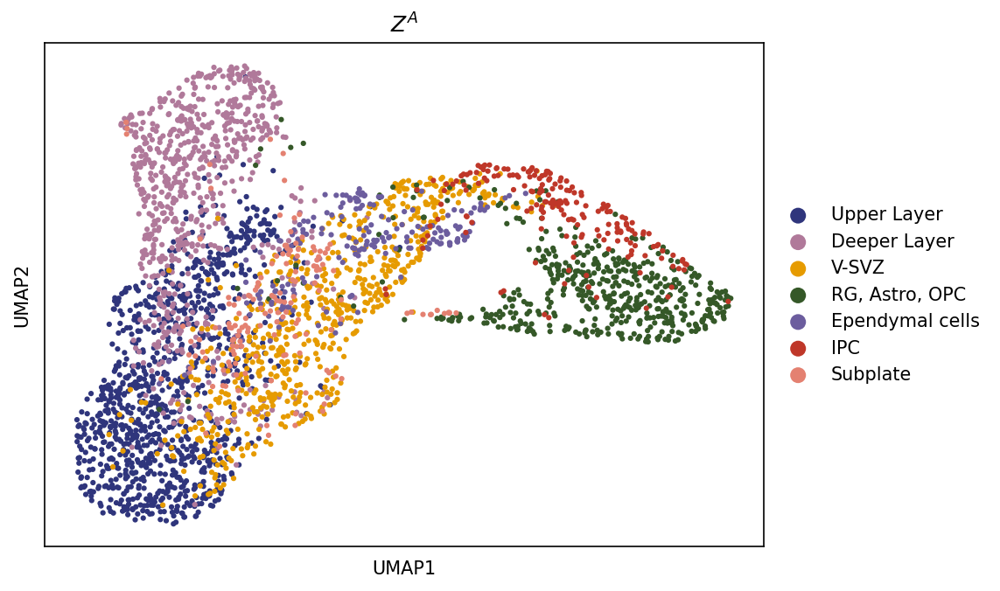

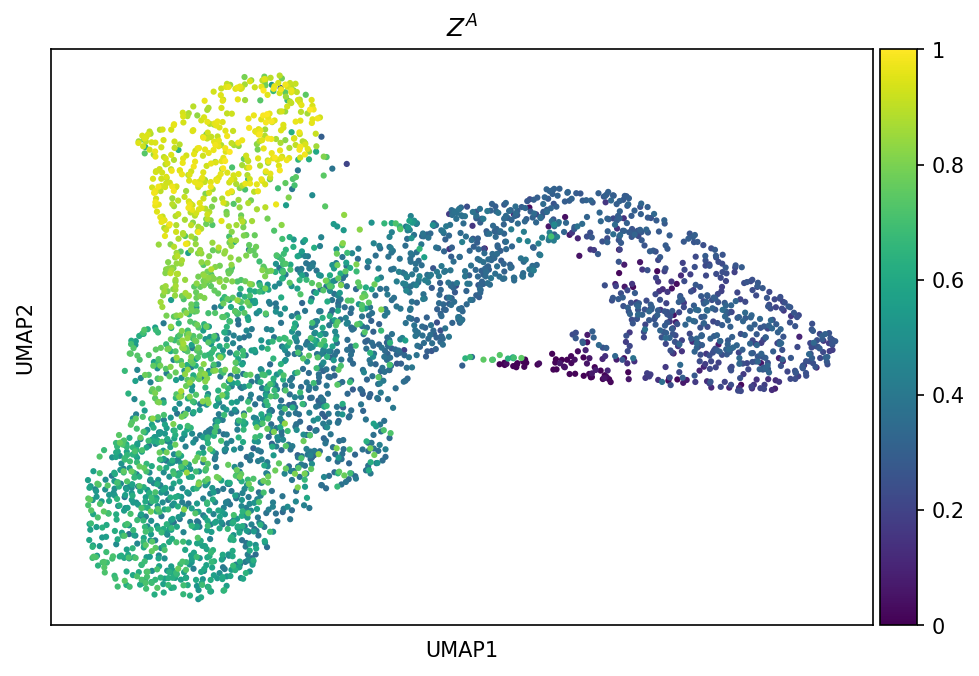

In [39]:
adata_result.obsm["latent"] = latent_expr_indep
sc.pp.neighbors(adata_result, use_rep="latent", n_neighbors=25)

sc.tl.umap(adata_result,min_dist =0.5)
# sc.tl.louvain(adata_mvi)

%matplotlib inline
# sc.pl.umap(adata_mvi, color=['celltype'])
sc.pl.scatter(adata_result,color='celltype',basis='umap',
             title = '$Z^{A}$',palette=colors)
plt.show()

sc.pl.scatter(adata_result,color='latent_time',basis='umap',
             title = '$Z^{A}$',palette=colors)
plt.show()

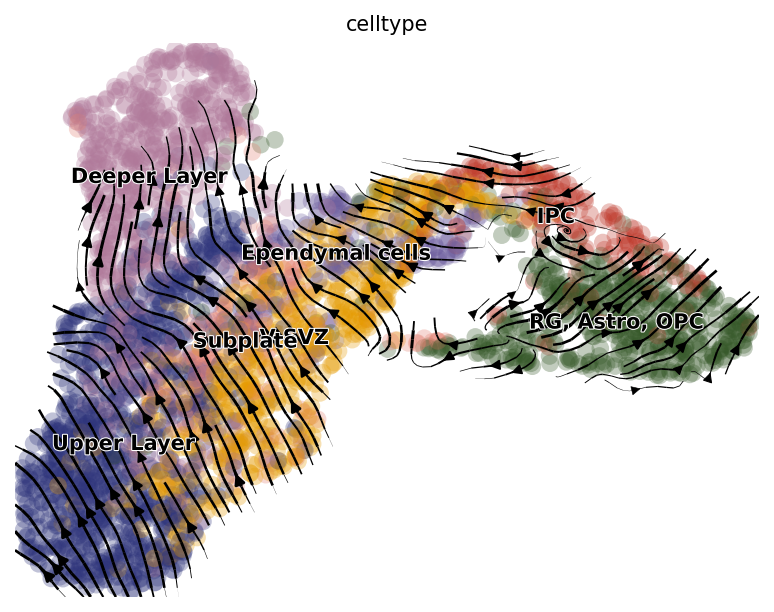

In [40]:
mv.velocity_embedding_stream(adata_result, basis='umap', color='celltype')

# Decoupled gene

In [111]:
adata_mvi.var_names

Index(['Xkr4', 'Gm1992', 'Gm19938', 'Rp1', 'Mrpl15', 'Lypla1', 'Tcea1',
       'Rgs20', 'Atp6v1h', 'Rb1cc1',
       ...
       'GL456216.1:11347-11758', 'GL456216.1:13542-14334',
       'GL456216.1:15464-18054', 'GL456216.1:25846-26201',
       'GL456216.1:30513-36234', 'GL456216.1:37994-39286',
       'GL456216.1:40534-41810', 'GL456216.1:49045-49376',
       'JH584292.1:12573-14868', 'JH584295.1:0-1976'],
      dtype='object', length=138466)

In [119]:
len(adata_mvi.var_names.values)

138466

In [120]:
featues_name = adata_mvi.var_names.values

In [146]:
idx = [4098, 8199, 18, 8211, 12307, 2071, 4120, 10265, 29, 12320, 14368, 8229, 4133, 4135, 40, 4136, 2096, 4148, 4152, 14393, 4156, 8253, 10303, 14400, 2115, 4166, 10312, 10315, 6222, 8279, 88, 12377, 6231, 2139, 102, 103, 6249, 2154, 8300, 14444, 10350, 10351, 10354, 116, 14452, 2167, 4216, 8313, 4219, 10370, 12418, 2180, 2181, 10375, 12424, 4234, 4238, 4239, 8338, 8340, 4245, 8343, 151, 4247, 12439, 12441, 14488, 157, 158, 6303, 161, 2212, 8357, 10404, 8359, 12452, 12453, 12455, 4264, 4265, 6326, 183, 2231, 8378, 10427, 2236, 14526, 8384, 6338, 195, 199, 2248, 12489, 6346, 2252, 2253, 10446, 6348, 208, 6349, 2258, 2261, 2264, 6361, 8410, 10458, 8412, 221, 6362, 10463, 6369, 2274, 227, 12515, 6376, 237, 10478, 4336, 14578, 8436, 12532, 246, 247, 4342, 14580, 250, 251, 6392, 4351, 8449, 10497, 12545, 10500, 12548, 12551, 12552, 265, 8457, 4361, 4362, 8461, 2318, 6407, 6414, 6415, 10514, 12564, 10517, 2329, 6429, 10526, 12575, 10528, 4386, 291, 4387, 6434, 8488, 298, 12587, 2349, 6449, 306, 311, 6459, 316, 10557, 4414, 319, 10559, 2368, 4415, 12609, 12613, 6470, 6471, 8522, 6477, 2382, 6479, 2387, 6483, 345, 8537, 12638, 351, 10592, 12642, 8548, 6500, 12646, 12283, 12647, 12648, 8556, 10605, 10608, 12657, 8563, 12660, 4472, 4475, 10622, 384, 4480, 6529, 389, 390, 6535, 8585, 4491, 397, 398, 2445, 10642, 14327, 8598, 10646, 10648, 2457, 10649, 12701, 6560, 14330, 420, 4516, 8614, 4517, 2472, 8618, 2474, 4525, 6575, 10680, 12735, 2499, 2502, 12743, 10696, 10697, 8650, 4552, 8652, 10700, 12748, 6599, 2512, 4562, 2519, 8664, 10711, 12759, 8667, 12760, 6615, 6617, 6621, 10720, 481, 483, 2531, 4581, 8678, 6630, 488, 12781, 2545, 6645, 8696, 6648, 12795, 10751, 2564, 10757, 4612, 2568, 10760, 523, 8715, 2578, 10770, 8724, 4634, 8742, 8743, 8744, 10792, 8749, 4654, 10801, 562, 8755, 2612, 8757, 12849, 4660, 6706, 4667, 6715, 8767, 581, 8776, 4680, 2634, 587, 8779, 2639, 4688, 10834, 8790, 8792, 4696, 2650, 4697, 12892, 8797, 12896, 8805, 2663, 616, 4713, 10859, 622, 6768, 6769, 4722, 2678, 4728, 12925, 6784, 12933, 4747, 4749, 8846, 656, 6800, 2707, 2710, 10902, 4759, 4760, 667, 668, 669, 670, 8864, 674, 4770, 676, 6820, 10920, 6824, 10924, 10927, 2737, 2738, 12977, 6837, 12983, 697, 8889, 2748, 8896, 705, 6848, 708, 6856, 8905, 8910, 4817, 10964, 4821, 2776, 4824, 10971, 8924, 733, 10977, 739, 4835, 6884, 8934, 748, 13038, 8943, 2806, 8951, 2808, 6908, 2813, 8961, 772, 11013, 2824, 11016, 8974, 6927, 2833, 8983, 8987, 4891, 13085, 11038, 6941, 6949, 8999, 13098, 6954, 812, 4909, 13100, 6956, 4918, 9015, 2873, 9018, 13114, 9022, 9029, 11078, 4933, 13127, 4938, 11083, 4941, 847, 2901, 9049, 11098, 7001, 11101, 864, 9057, 2912, 2914, 2916, 2917, 870, 11109, 874, 13163, 876, 4972, 2926, 13166, 7019, 9073, 13169, 11123, 9076, 4978, 13175, 13176, 11129, 4989, 4990, 2943, 13181, 7041, 9093, 13189, 11144, 11146, 908, 5004, 7054, 2961, 9106, 11156, 13206, 9114, 5019, 9116, 5020, 7066, 932, 5029, 2985, 2986, 11177, 13228, 943, 944, 11184, 2993, 2994, 948, 9141, 11185, 2997, 13231, 11193, 954, 7100, 7101, 3007, 3008, 9154, 11211, 11212, 11215, 977, 978, 13272, 5081, 7128, 11228, 5084, 3044, 9189, 3045, 3046, 9192, 7146, 7147, 11245, 9201, 1010, 3062, 1015, 3064, 5110, 5111, 1019, 1020, 1022, 13311, 3072, 3077, 5127, 3084, 3086, 11281, 11282, 7186, 5141, 13336, 7194, 3099, 1052, 9244, 1054, 9245, 3101, 11296, 5154, 9254, 7209, 13365, 3126, 1081, 5183, 1088, 11329, 13376, 13379, 1092, 7239, 11336, 9290, 5194, 7248, 11345, 13396, 11352, 7259, 3165, 1126, 5222, 7272, 13417, 11370, 1131, 3179, 13419, 11374, 5231, 7275, 13425, 9330, 13426, 1140, 11382, 11385, 13434, 7292, 11390, 13438, 7294, 7295, 5251, 3204, 9349, 1158, 11399, 13447, 5258, 1163, 5259, 5260, 13450, 13451, 7315, 3230, 13470, 9380, 13482, 9387, 7338, 11438, 13491, 9397, 9398, 9403, 13499, 5310, 3269, 7367, 7370, 7371, 13518, 5327, 1234, 11474, 9433, 3290, 3298, 11493, 11494, 9447, 5350, 13543, 13544, 13545, 1260, 7399, 1262, 3311, 11503, 7404, 11506, 3315, 1268, 1269, 11510, 13556, 5369, 13563, 13570, 3332, 13572, 7428, 7430, 5384, 1290, 11531, 13579, 13582, 7438, 1296, 3345, 7442, 3349, 1302, 9499, 1310, 9502, 3361, 11564, 7469, 5423, 13617, 11572, 11574, 1335, 9527, 13622, 5437, 5438, 1343, 5440, 3393, 7487, 3397, 1352, 9549, 7501, 13647, 1361, 3409, 5465, 7515, 5473, 7522, 1379, 11619, 5475, 1382, 13671, 7525, 1385, 9578, 1388, 11628, 7536, 9585, 7538, 9587, 9588, 9589, 5496, 1401, 1402, 1403, 5503, 1408, 1409, 11649, 13695, 11652, 5505, 5506, 13702, 11660, 9617, 9622, 13723, 11677, 3488, 13729, 13731, 1444, 3492, 11689, 7593, 3501, 13741, 9647, 1457, 3506, 9651, 7601, 1461, 13749, 3511, 5558, 7607, 13762, 11721, 3530, 9675, 9676, 3533, 9680, 13778, 1492, 1494, 3543, 5592, 13788, 1502, 5600, 7650, 5603, 3557, 3558, 5605, 1513, 1514, 11753, 1516, 3565, 7661, 3568, 1525, 1526, 11765, 11768, 9721, 11771, 7677, 1534, 13822, 3584, 5631, 11778, 7682, 1540, 1541, 11781, 3590, 7689, 5643, 7692, 11790, 1552, 5652, 9752, 9753, 3611, 1564, 13851, 7707, 9760, 3617, 9767, 9768, 11817, 3629, 1583, 9775, 11823, 13872, 5683, 7729, 5685, 1590, 7734, 1592, 13881, 1596, 7740, 7741, 3651, 3653, 3654, 13902, 3663, 13907, 11862, 9815, 3673, 1629, 3677, 5726, 7775, 5731, 13923, 9830, 11878, 9832, 7787, 3694, 3695, 11887, 11891, 13939, 9845, 3701, 9847, 3702, 11894, 7795, 7804, 9854, 9855, 11903, 3712, 5758, 9860, 9861, 3718, 7819, 3729, 11924, 5783, 13975, 5788, 7837, 5791, 11936, 1700, 3751, 1704, 11945, 5800, 3755, 5801, 3757, 11949, 13993, 5806, 13999, 3762, 9907, 5808, 5810, 14002, 7857, 1720, 5817, 5819, 7867, 11965, 14014, 14016, 14017, 7876, 9925, 14027, 7883, 3789, 5838, 9936, 11986, 3795, 7895, 11992, 14041, 14044, 1759, 7904, 5857, 1763, 3813, 12007, 1768, 3816, 9962, 12008, 3819, 1773, 1774, 5867, 5871, 14064, 12020, 12021, 12022, 5878, 12024, 12026, 14075, 1788, 14076, 3840, 1793, 12032, 14081, 12037, 5894, 7941, 7943, 9994, 3852, 12049, 3859, 12053, 3864, 3865, 1820, 12061, 1824, 3874, 12071, 5933, 12080, 7986, 10035, 10039, 14136, 5945, 1852, 10044, 1854, 12095, 1856, 10048, 10049, 1859, 14141, 5957, 8002, 5959, 14153, 8009, 1871, 12116, 8021, 8023, 3931, 10076, 3935, 5983, 10082, 14178, 5990, 12138, 12140, 12145, 1906, 12146, 1908, 12148, 14195, 14198, 1912, 10104, 10106, 1915, 14201, 12157, 8059, 12159, 8061, 3971, 6020, 14213, 12166, 8069, 12171, 10125, 6032, 1937, 10133, 1942, 1943, 10137, 14234, 14235, 8090, 1950, 14242, 6051, 8098, 10151, 14249, 8108, 4013, 1966, 4014, 12205, 8115, 1977, 8121, 14267, 1980, 12221, 6076, 8125, 10176, 8131, 10183, 4044, 12237, 14286, 14287, 12243, 12246, 4060, 2017, 10209, 2019, 8164, 12263, 10219, 12267, 2029, 10221, 4076, 6128, 12273, 14323, 14326, 2039, 10234, 4091, 12286, 12287]

In [147]:
decoupled_gene = featues_name[idx ]

In [1]:
decoupled_gene

NameError: name 'decoupled_gene' is not defined

In [150]:
np.savetxt('../E18_mouse_Brain/GO_analysis/decouple.txt', decoupled_gene, delimiter=',',fmt='%s')

In [142]:
coupled_gene = featues_name[[2049, 6146, 12293, 8200, 4118, 2073, 10270, 30, 4128, 8223, 4130, 8238, 10286, 12341, 14394, 12346, 12347, 12349, 12353, 10321, 4184, 14428, 10338, 6244, 4202, 14447, 8306, 12408, 120, 10362, 6268, 4223, 2188, 141, 6284, 143, 8337, 4242, 4243, 10388, 6311, 14513, 10420, 10433, 2242, 2243, 6339, 197, 4297, 203, 204, 8395, 12498, 6360, 4315, 2276, 4325, 12518, 6375, 8427, 14573, 4338, 2311, 2328, 281, 10531, 4390, 8487, 10540, 4400, 4401, 8499, 310, 10551, 315, 2363, 2365, 2379, 4435, 2389, 8576, 4489, 6543, 6547, 12697, 6566, 6580, 4551, 459, 10703, 2525, 8672, 10733, 6660, 6661, 519, 8716, 4628, 6683, 6684, 12834, 565, 572, 10814, 2630, 4679, 4682, 6735, 601, 6746, 4704, 2659, 635, 6789, 6806, 2722, 4780, 12989, 712, 8912, 4819, 2774, 6877, 6878, 6879, 4832, 10978, 6890, 2800, 2804, 8948, 8949, 764, 2819, 4870, 2827, 11026, 6964, 9012, 13113, 832, 4928, 7003, 11104, 7011, 9071, 7030, 888, 889, 11130, 890, 891, 892, 893, 7034, 7038, 9086, 4994, 11135, 7049, 13195, 912, 5012, 5015, 2971, 5021, 11168, 9123, 9125, 13221, 9129, 13245, 13252, 3022, 11256, 7173, 5135, 5144, 5146, 9247, 5165, 5186, 5201, 5216, 3173, 5229, 5237, 9333, 5272, 9369, 1178, 3226, 5288, 3273, 3276, 1237, 9431, 3288, 7394, 7396, 9446, 1259, 5358, 3316, 1275, 9471, 1288, 3336, 7435, 1294, 7449, 1307, 11551, 13599, 7464, 13611, 11586, 9539, 5448, 11600, 11611, 9571, 13667, 13678, 3458, 11653, 11655, 11669, 9628, 13725, 5540, 13744, 1469, 11710, 5570, 3524, 13770, 3549, 9697, 5607, 9707, 1529, 11773, 13823, 11796, 3609, 5676, 9790, 9793, 9794, 9810, 7763, 11858, 5718, 5721, 11866, 5729, 3686, 7785, 1643, 13931, 5744, 5751, 11896, 13948, 9856, 11913, 11916, 3724, 5772, 13967, 9872, 9871, 1686, 9879, 7842, 11940, 7849, 13996, 5823, 5824, 14015, 3784, 11978, 11980, 7898, 9968, 5889, 1794, 7955, 5912, 3867, 3868, 14116, 5927, 7977, 1835, 1838, 7985, 7998, 8000, 10052, 12113, 14162, 3923, 14200, 8065, 14209, 1926, 1927, 10124, 6033, 12179, 12181, 14229, 3994, 10142, 10163, 4022, 8119, 6092, 2000, 10207, 6112, 2020, 4072, 6124, 2035, 6134
] ]
np.savetxt('../E18_mouse_Brain/couple.txt', coupled_gene, delimiter=',',fmt='%s')